# South Florida Cypress Wetlands Trophic Networks
The following is an analysis of trophic networks observed in south florida cypress wetlands in dry and wet seasons of 1996-1997.
Data is taken from R. Ulanowicz, C. Bondavalli, and M. Egnotovich, "Network analysis of trophic dynamics in South Florida ecosystem, fy 97: The florida bay ecosystem," Annual Report to the U. S. Geo. Service Biological Resources Division (1998). These networks were assembled by a combination of fieldwork and simulation. Both the dry and wet networks are fully connected and contain 128 nodes representing species present in the cypress wetlands ecosystem. The dry network contains 2137 directed edges, while the wet network contains 2106 directed edges, each signifying biomass transfer. The networks are weighted to indicate relative magnitudes of biomass transfer between species.

The species corresponding to node 18 and node 57 are shown to be particularly important to normal ecosystem trophic dynamics. To simulate the impact of extinction of one or both of these keystone species, network centrality measures are compared among networks in which these nodes (and all related edges) are removed.

Community detection is used to divide the networks into preferentially self-interacting groups. Graph matching between the dry and wet trophic networks demonstrates their similarity, and signal flow ranking is used to sort the species by predation level.

# Centrality Measures
The dry and wet trophic networks, designated baydry and baywet, respectively, are read from text files into graphs. 
Total degree, eigenvector centrality, PageRank, and betweenness centrality are computed for the nodes of each network. In both networks, node 57 has the highest total degree (110), eigenvector centrality (0.5538 dry, 0.5584 wet), and PageRank (0.2529 dry, 0.2371 wet), and node 18 has the highest betweenness centrality (0.3880 dry, 0.3838 wet). To simulate the extinction of these ecologically important species, one or both was removed from the network. The means and standard deviations of the four centrality measures were calculated for the regular (full) networks and the networks with node 18 removed (18R), node 57 removed (57R), and both node 18 and node 57 removed (1857R), as shown in the tables below. Some values in the tables are very small and approximated as zero.

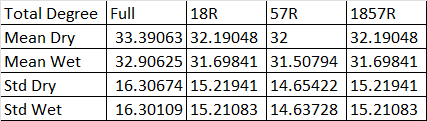
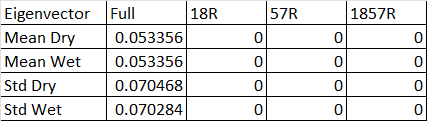
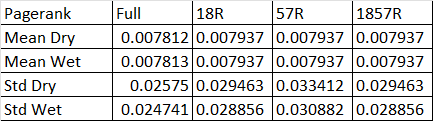
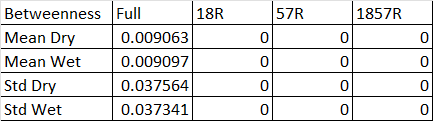

The cell below allows visual comparison of network layouts between the dry and wet networks and their 18R, 57R, and 1857R versions. The removal of node 57 has the largest visual impact: the layouts, constructed with the networkx spring_layout() function, are more symmetric compared to the original dry and wet networks, which were skewed toward the location of node 57. 
A species' total degree represents the total number of a species' biomass exchanges, regardless of the species' status as predator or prey. In-degree and out-degree were also computed. As node 57 has highest in-degree (109) in the dry and wet networks, it is consumed by the greatest number of other species. Node 84 has higest out-degree (63) in the dry network and node higest out-degree (62) in the wet network, meaning that they consume the largest variety of other species. 

Eigenvector centrality and PageRank are better measures of a species' importance to the ecosystem than total degree, as they account for a species' relation to other ecologically key species and species' amount of influence on others, respectively.
Betweenness centrality does not have a physical meaning in the case of trophic networks, but it can serve as measure of how many individual linear food chains a species can be part of.

The tables above indicate that the removal of species 18 and 57 have mixed results on the centrality measures. A decrease in mean centrality measures can suggest that the ecosystem has been damaged by the loss of one of these key species. Increases, by contrast, may indicate that the ecosystem adapts, with previously suppressed species taking larger roles.

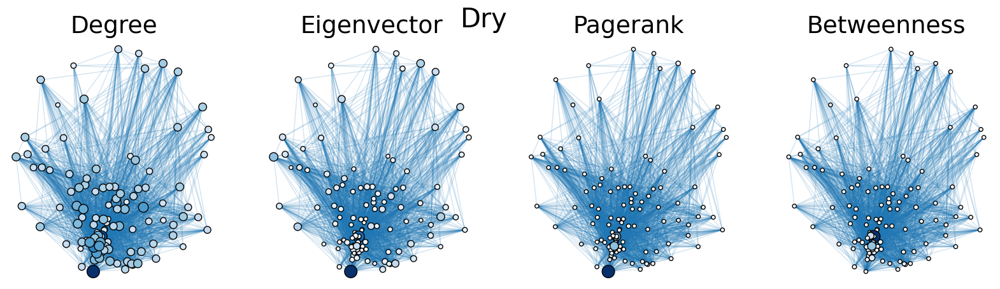

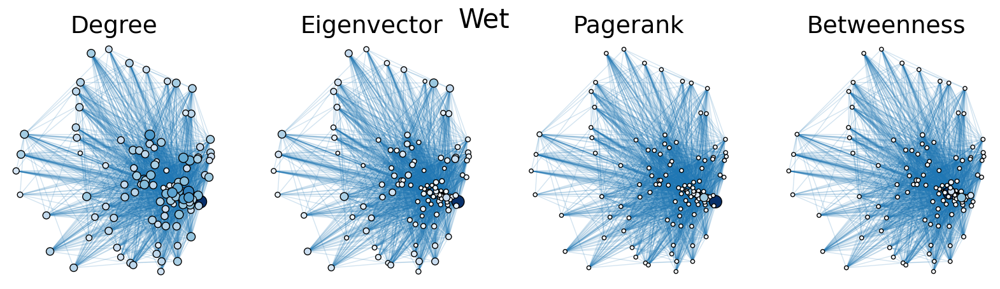

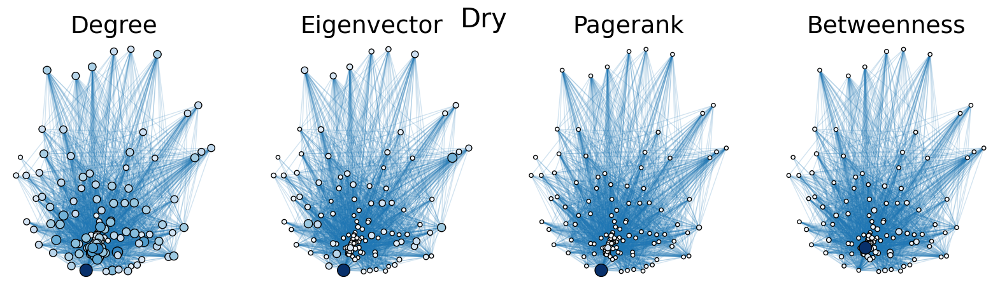

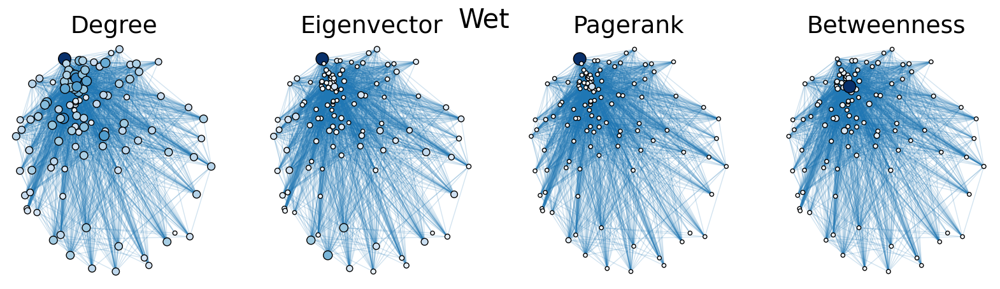

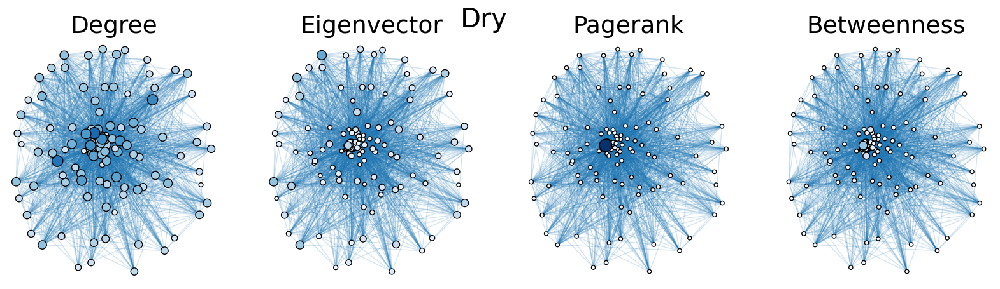

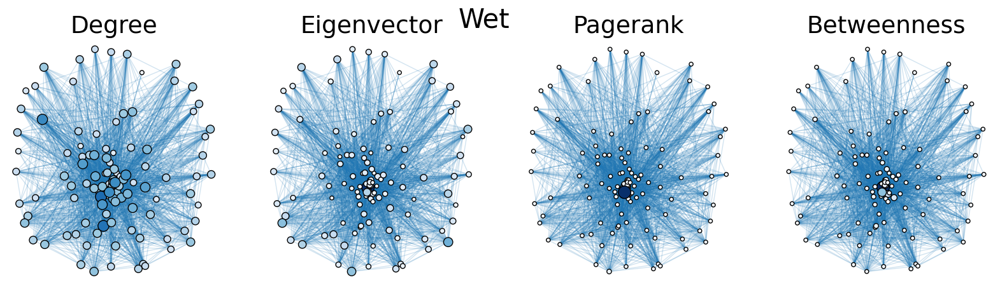

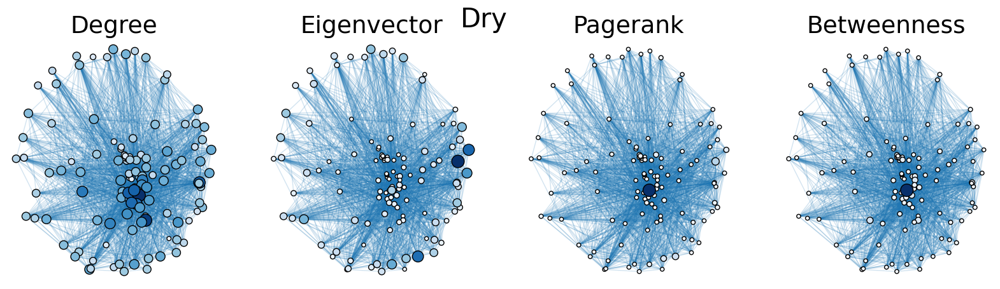

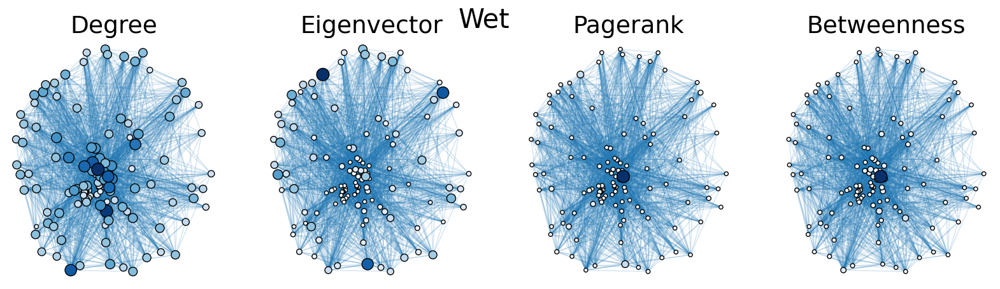

In [1]:
import seaborn as sns
import pandas as pd
import numpy as np
import networkx as nx
from matplotlib import colors
import matplotlib.pyplot as plt
from graspologic.utils import *
from graspologic.plot import *

def plot_node_scaled_network(A, node_data, key, ax):
    # REF: https://github.com/mwaskom/seaborn/blob/9425588d3498755abd93960df4ab05ec1a8de3ef/seaborn/_core.py#L215

    levels = list(np.sort(node_data[key].unique()))
    cmap = sns.color_palette("Blues", as_cmap=True)
    vmin = np.min(levels)
    norm = colors.Normalize(vmin=0.3 * vmin)
    palette = dict(zip(levels, cmap(norm(levels))))

    networkplot(
        A,
        node_data=node_data,
        x="x",
        y="y",
        ax=ax,
        edge_linewidth=1.0,
        node_size=key,
        node_hue=key,
        palette=palette,
        node_sizes=(20, 200),
        node_kws=dict(linewidth=1, edgecolor="black"),
        node_alpha=1.0,
        edge_kws=dict(color=sns.color_palette()[0])
    )

    ax.axis("off")
    ax.set_title(key.capitalize())

def map_to_nodes(node_map):
    node_map.setdefault(0)
    nodelist = list(baydry.nodes)
    # utility function to make it easy to compare dicts to array outputs
    return np.array(np.vectorize(lambda x: node_map.setdefault(x, 0))(nodelist))

def remove_m(gd, gw, index):
    #  Removes one node specified by index from the dry (gd) and wet (gw) networks.
    nodelist = list(gd.nodes)
    GD = nx.to_numpy_array(gd, nodelist=nodelist)
    GW = nx.to_numpy_array(gw, nodelist=nodelist)
    
    GD = np.delete(GD, index, 0)
    GD = np.delete(GD, index, 1)
    
    GW = np.delete(GW, index, 0)
    GW = np.delete(GW, index, 1)
    
    gd_del = nx.from_numpy_array(GD, create_using=nx.DiGraph)
    gw_del = nx.from_numpy_array(GW, create_using=nx.DiGraph)
    return gd_del, gw_del
    
def compare_centrality(baydry, baywet):
    # Plots centrality measures for dry and wet networks.
    
    nodelist1 = list(baydry.nodes)
    BD = nx.to_numpy_array(baydry, nodelist=nodelist1) # weighted numpy array
    BW = nx.to_numpy_array(baywet, nodelist=nodelist1) # weighted numpy array

    node_data_bd = pd.DataFrame(index=baydry.nodes())
    node_data_bd["degree"] = node_data_bd.index.map(dict(nx.degree(baydry)))
    node_data_bd["eigenvector"] = node_data_bd.index.map(nx.eigenvector_centrality(baydry))
    node_data_bd["pagerank"] = node_data_bd.index.map(nx.pagerank(baydry))
    node_data_bd["betweenness"] = node_data_bd.index.map(nx.betweenness_centrality(baydry))

    pos_bd = nx.spring_layout(baydry)
    node_data_bd["x"] = [pos_bd[node][0] for node in node_data_bd.index]
    node_data_bd["y"] = [pos_bd[node][1] for node in node_data_bd.index]

    node_data_bw = pd.DataFrame(index=baywet.nodes())
    node_data_bw["degree"] = node_data_bw.index.map(dict(nx.degree(baywet)))
    node_data_bw["eigenvector"] = node_data_bw.index.map(nx.eigenvector_centrality(baywet))
    node_data_bw["pagerank"] = node_data_bw.index.map(nx.pagerank(baywet))
    node_data_bw["betweenness"] = node_data_bw.index.map(nx.betweenness_centrality(baywet))

    pos_bw = nx.spring_layout(baywet)
    node_data_bw["x"] = [pos_bw[node][0] for node in node_data_bw.index]
    node_data_bw["y"] = [pos_bw[node][1] for node in node_data_bw.index]

    sns.set_context("talk", font_scale=1.5)
    fig1, axs1 = plt.subplots(1, 4, figsize=(20, 5))
    fig2, axs2 = plt.subplots(1, 4, figsize=(20, 5))

    plot_node_scaled_network(BD, node_data_bd, "degree", axs1[0])
    plot_node_scaled_network(BD, node_data_bd, "eigenvector", axs1[1])
    plot_node_scaled_network(BD, node_data_bd, "pagerank", axs1[2])
    plot_node_scaled_network(BD, node_data_bd, "betweenness", axs1[3])

    plot_node_scaled_network(BW, node_data_bw, "degree", axs2[0])
    plot_node_scaled_network(BW, node_data_bw, "eigenvector", axs2[1])
    plot_node_scaled_network(BW, node_data_bw, "pagerank", axs2[2])
    plot_node_scaled_network(BW, node_data_bw, "betweenness", axs2[3])

    fig1.suptitle('Dry', fontsize=30)
    fig2.suptitle('Wet', fontsize=30)
    fig1.set_facecolor("w")
    fig2.set_facecolor("w")

    # Uncomment the following lines for sets of dot plots comparing the centrality measures.
    
    #sns.pairplot(node_data_bd, vars=['degree', 'eigenvector', 'pagerank', 'betweenness'], height=4)
    #sns.pairplot(node_data_bw, vars=['degree', 'eigenvector', 'pagerank', 'betweenness'], height=4)
    

baydry = nx.read_weighted_edgelist('baydry.txt', create_using=nx.DiGraph) # weighted graph
baywet = nx.read_weighted_edgelist('baywet.txt', create_using=nx.DiGraph) # weighted graph

bd18, bw18 = remove_m(baydry, baywet, 17) # Networks with node 18 removed (17 is the index of node 18).

bd57, bw57 = remove_m(baydry, baywet, 56) # Networks with node 57 removed.

bd1857, bw1857 = remove_m(bd57, bw57, 17) # Networks with node 18 and node 57 removed.

# Comment/uncomment the following statements to compare different network versions.
compare_centrality(baydry, baywet) 
compare_centrality(bd18, bw18)
compare_centrality(bd57, bw57)
compare_centrality(bd1857, bw1857)

# Community Detection
Leiden partitioning is used to divide the dry and wet networks into preferentially self-interacting groups. The modularity scores 0.2994854160522282 and 0.3270457717063401 for the dry and wet networks, respectively, are relatively low, indicating that there are not clear community divisions. This is expected for a trophic network because trophic interactions are largely between two individuals (represented by an edge) and directional. However, the larger modularity of the wet network may indicate that species are less able to interact with others, possibly by geographic separation. Indeed, the wet network has fewer edges than the dry network, which can further support this idea of hindered interaction in the wet season. The code below plots network layouts depicting the leiden-partitioned networks and heatmaps representing the grouped networks.

0.2994854160522282
0.32704577170634


(<Figure size 1500x700 with 4 Axes>,
 array([<AxesSubplot: >, <AxesSubplot: >], dtype=object))

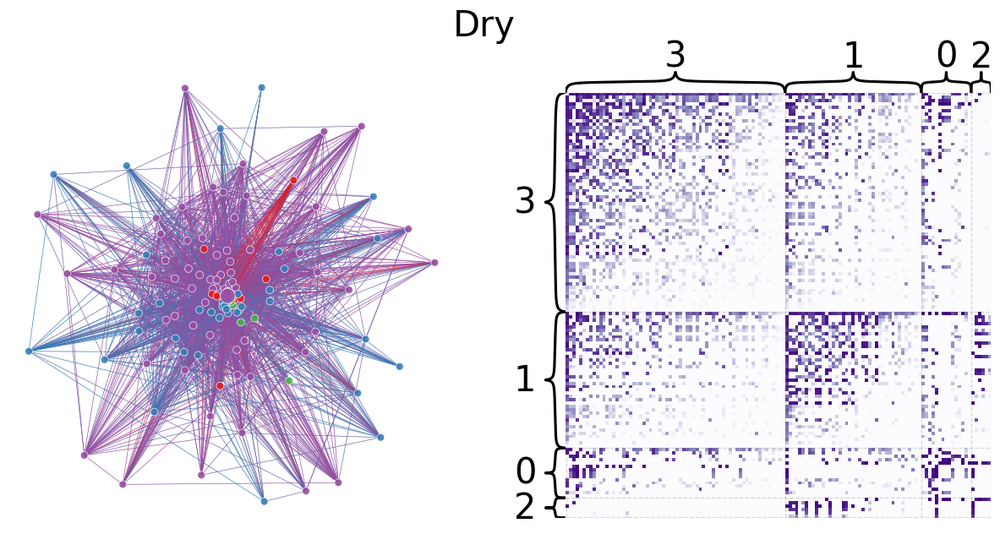

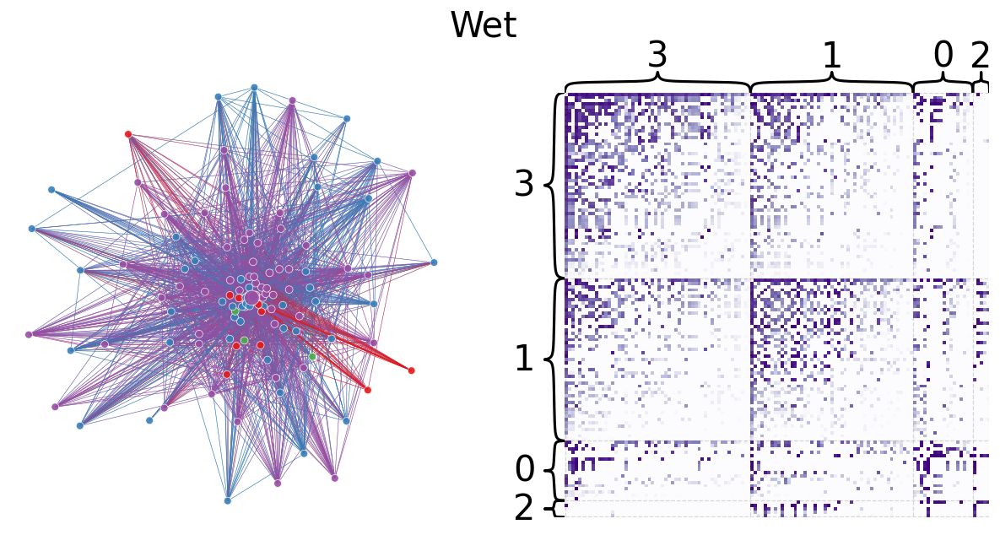

In [2]:
# Graphs are weighted for layout but normalized for heatmap.

import networkx as nx
import pandas as pd
from graspologic.plot import networkplot, heatmap
from graspologic.partition import leiden, modularity
from graspologic.utils import pass_to_ranks

def plot_network_leiden_partition(g, title):

    nodelist = list(g.nodes)
    node_df = pd.DataFrame(index=nodelist)

    #pos = nx.kamada_kawai_layout(g)
    pos = nx.spring_layout(g)

    xs = []
    ys = []
    for node in nodelist:
        xs.append(pos[node][0])
        ys.append(pos[node][1])
    xs = np.array(xs)
    ys = np.array(ys)

    node_df["x"] = xs
    node_df["y"] = ys

    adj = nx.to_numpy_array(g, nodelist=nodelist)
    n = adj.shape[0]
    adj_ptr = pass_to_ranks(adj)

    node_df["degree"] = adj.sum(axis=0)

    leiden_partition_map = leiden(g, trials=100)
    print(modularity(g, leiden_partition_map))

    node_df['leiden_partition'] = node_df.index.map(leiden_partition_map)
    partition_key = 'leiden_partition'

    fig, axs = plt.subplots(1, 2, figsize=(15, 7))

    networkplot(
        adj,
        x="x",
        y="y",
        node_data=node_df.reset_index(),
        node_alpha=0.9,
        edge_alpha=0.7,
        edge_linewidth=0.4,
        node_hue=partition_key,
        node_size="degree",
        edge_hue="source",
        ax=axs[0],
    )
    _ = axs[0].axis("off")

    _ = heatmap(
        adj_ptr,
        inner_hier_labels=node_df[partition_key],
        ax=axs[1],
        cbar=False,
        cmap="Purples",
        vmin=0,
        center=None,
        sort_nodes=True,
    )

    fig.suptitle(title, fontsize=30)
    return fig, axs

baydry = nx.read_weighted_edgelist('baydry.txt', create_using=nx.Graph)
plot_network_leiden_partition(baydry, 'Dry')

baywet = nx.read_weighted_edgelist('baywet.txt', create_using=nx.Graph)
plot_network_leiden_partition(baywet, 'Wet')

# Graph Matching
The dry and wet networks are made unweigted and subjected to graph matching. The code below plots the dry and wet aligned heatmaps. There are 43 edge disagreements between the two networks, and the wet network contains 31 fewer edges than the dry network. There great similarity between dry and wet networks indicates that seasonal weather conditions do not have a major impact on interspecies biomass transfer.

Number of edge disagreements:  43


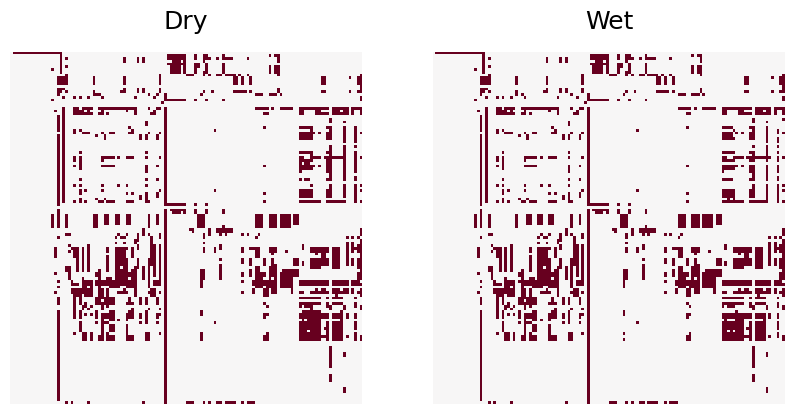

In [3]:
import numpy as np
import networkx as nx
from graspologic.match import graph_match
from graspologic.simulations import er_np
from graspologic.utils import *
from graspologic.plot import *
import matplotlib.pyplot as plt


np.random.seed(1)
rng = np.random.default_rng(8888)

baydry = nx.read_weighted_edgelist('baydry.txt', create_using=nx.DiGraph) # weighted graph
baywet = nx.read_weighted_edgelist('baywet.txt', create_using=nx.DiGraph) # weighted graph
nodelist = list(baydry.nodes)
BD = nx.to_numpy_array(baydry, nodelist=nodelist) # weighted numpy array
BW = nx.to_numpy_array(baywet, nodelist=nodelist) # weighted numpy array
BD_bin = binarize(BD).astype(int) # binary numpy array
BW_bin = binarize(BW).astype(int) # binary numpy array

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
heatmap(BD_bin, cbar=False, title="Dry", ax=axs[0])
_ = heatmap(BW_bin, cbar=False, title="Wet", ax=axs[1])
_, perm_inds, _, _ = graph_match(BD_bin, BW_bin, rng=rng)
BW_bin = BW_bin[np.ix_(perm_inds, perm_inds)]
print("Number of edge disagreements: ", np.sum(abs(BD_bin - BW_bin)))

# Ranking
The code below uses the signal flow algorithm to rank the species of the dry and wet trophic networks by relative predation level. The "apex predator" in both ecosystems, according to the signal flow results, is species 1. Species 57, seen above by the degree, eigenvector, and PageRank centrality measures to be an important species to the ecosystem, has the lowest signal flow score, meaning it is a major food source for other species. The rankings of the dry and wet network species are not identical but are very similar. Layouts weighted by signal flow score are also plotted by the code.

1      2.164899
4      1.344438
8      1.335031
6      1.332861
7      1.297969
         ...   
121   -0.523228
76    -0.638422
65    -0.703830
66    -0.844189
57    -1.146383
Length: 128, dtype: float64
1     2.164304
4     1.327395
8     1.312416
7     1.297062
15    1.231258
        ...   
65   -0.554642
53   -0.604947
76   -0.617998
66   -0.720421
57   -1.135755
Length: 128, dtype: float64


<AxesSubplot: title={'center': 'Wet'}>

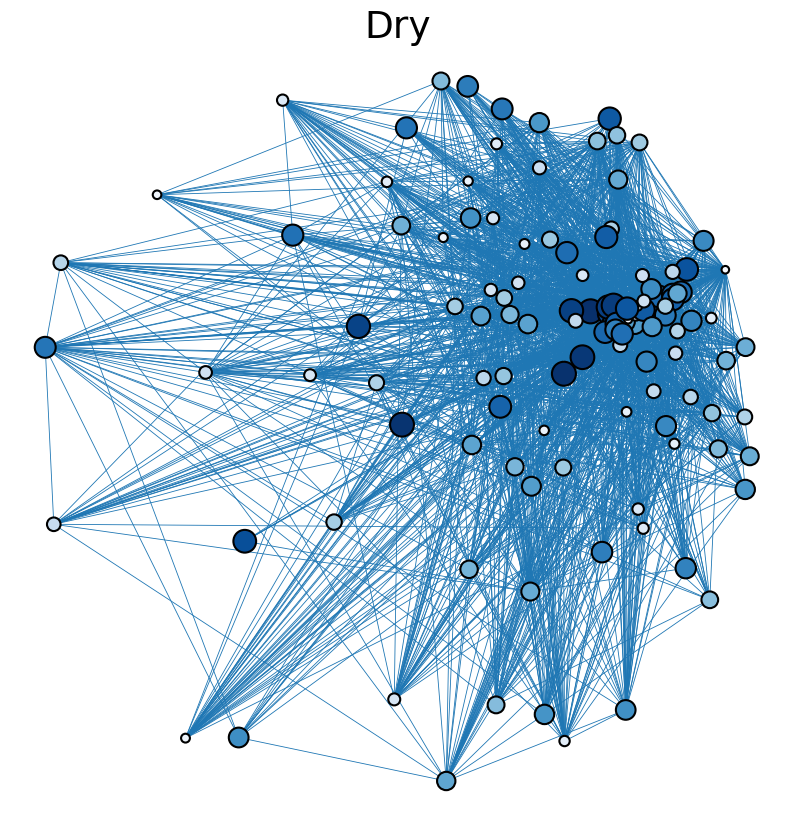

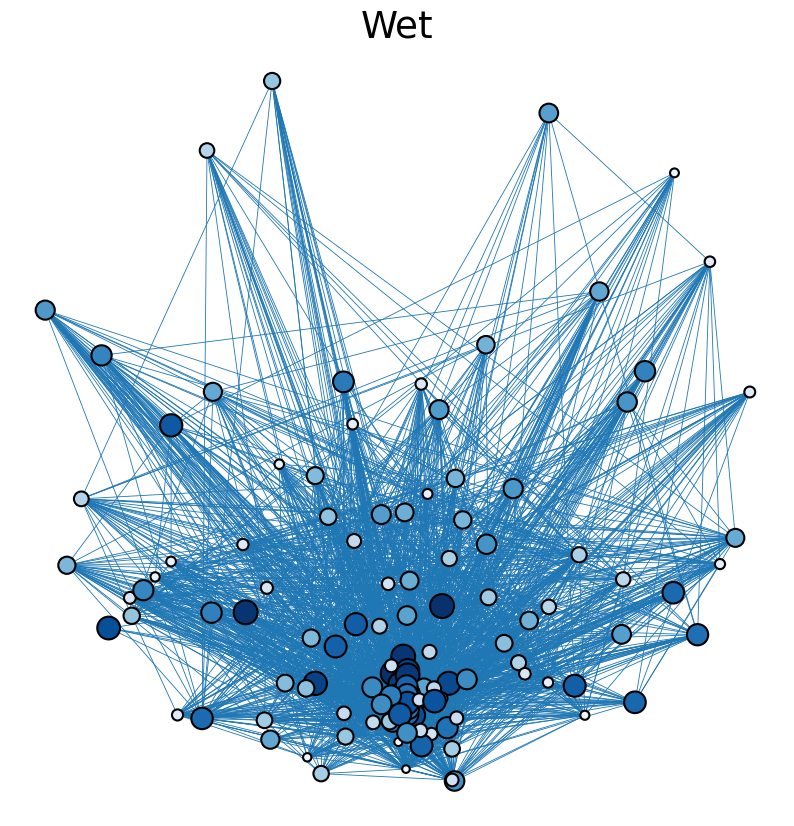

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from graspologic.plot import *
import seaborn as sns
from matplotlib import colors
from scipy.stats import rankdata
import networkx as nx
from graspologic.partition import leiden

def plot_network_color_scaled(g, g_sym, key, title):
    
    pos = nx.spring_layout(g)

    nodelist = list(g.nodes)
    node_data = pd.DataFrame(index=nodelist)

    xs = []
    ys = []
    for node in nodelist:
        xs.append(pos[node][0])
        ys.append(pos[node][1])
    xs = np.array(xs)
    ys = np.array(ys)

    node_data["x"] = xs
    node_data["y"] = ys

    partition_map = leiden(g_sym, trials=100, random_seed=8888)
    labels = np.vectorize(partition_map.get)(nodelist)

    node_data["leiden_labels"] = labels

    palette = dict(zip(np.unique(labels), sns.color_palette("tab10")))

    A = nx.to_numpy_array(g, nodelist=nodelist) 

    W = (A + A.T) / 2
    D = np.diag(np.sum(W, axis=1))

    L = D - W

    b = np.sum(W * np.sign(A - A.T), axis=1)
    L_dagger = np.linalg.pinv(L)  # this is the Moore-Penrose inverse
    z = L_dagger @ b

    signal_flow_rank = pd.Series(data=z, index=nodelist)
    node_data["sf_rank"] = signal_flow_rank - signal_flow_rank.min()
    signal_flow_rank.sort_values(ascending=False)
    print(signal_flow_rank.sort_values(ascending=False))
    node_data["sf_rank_order"] = rankdata(node_data["sf_rank"])
    
    levels = list(np.sort(node_data[key].unique()))
    cmap = sns.color_palette("Blues", as_cmap=True)
    vmin = np.min(levels)
    norm = colors.Normalize(vmin=0.3 * vmin)
    palette = dict(zip(levels, cmap(norm(levels))))

    ax = networkplot(
        A,
        node_data=node_data.reset_index(),  # bug in this function requires the .reset_index
        x="x",
        y="y",
        node_alpha=1.0,
        edge_alpha=1.0,
        edge_linewidth=0.6,
        node_hue=key,
        node_size=key,
        node_sizes=(30, 300),
        node_kws=dict(linewidth=1.5, edgecolor="black"),
        palette=palette,
        edge_kws=dict(color=sns.color_palette()[0]),
    )
    ax.axis("off")
    ax.set_title(title)
    return ax

baydry = nx.read_weighted_edgelist('baydry.txt', create_using=nx.DiGraph)
baydry_sym = nx.read_weighted_edgelist('baydry.txt', create_using=nx.Graph)

plot_network_color_scaled(baydry, baydry_sym, "sf_rank_order", 'Dry')
                                          
baywet = nx.read_weighted_edgelist('baywet.txt', create_using=nx.DiGraph)
baywet_sym = nx.read_weighted_edgelist('baywet.txt', create_using=nx.Graph)

plot_network_color_scaled(baywet, baywet_sym, "sf_rank_order", 'Wet')